In [3]:
import matplotlib.pyplot as plt
import gudhi
import numpy as np
import math 
from DensiTDA import sublevelsettools, graphtools, landmarktools, alphatools
import plotly.graph_objs as go
from plotly.offline import iplot
import plotly.express as px

# Generate Data Set

In [4]:
D = 3
n = 10000

Theta = 2 * math.pi * np.random.rand(n)
V = 2 * math.pi * np.random.rand(n)

In [5]:
a = 10
b = 5
epsilon = 0.1
perturb = 20

def parametrized_klein(u,v):
    
    return ((a + b * math.cos(v)) * math.cos(u) + b / perturb * np.random.normal(), (a + b * math.cos(v)) * math.sin(u) + b / perturb * np.random.normal(), b * math.sin(v) * math.cos( u / 2.0 ) + b / perturb * np.random.normal(), b * math.sin(v) * math.sin( u / 2.0 ) + b / perturb * np.random.normal())

zfunc = np.vectorize(parametrized_klein)

X, Y, Z, T = zfunc(Theta, V)

In [6]:
things_to_plot = []

things_to_plot.append(
        go.Scatter3d(x=X, y=Y, z=Z,
            mode='markers',
            marker=dict(
                size=5,
                color=T,                # set color to an array/list of desired values
                colorscale='viridis',   # choose a colorscale
                opacity=1
                ), 
            hoverinfo='none',
            showlegend=False)
    )

layout = go.Layout(autosize=False, width=900, height=900, showlegend = False, scene=dict(
                 aspectmode='data'
         ))
fig = go.Figure(data = things_to_plot, layout = layout)
iplot(fig)

# Landmark Points

In [7]:
S = np.stack((X,Y,Z,T)).T

In [8]:
# hyperparameters
d = S.shape[1]
h = np.std(S) * (len(S)) ** (-1 / (d + 4))
t = 1 / h ** 2
A = np.ones(len(S)) / (h * len(S))
s = 0.1

In [9]:
chosen_landmarks, powers = landmarktools.max_of_gaussians_landmarking(S, A, S, h, s)

Initializing Distrbution over Candidate Landmark Points:


100%|███████████████████████████████████████| 1000/1000 [00:26<00:00, 38.46it/s]


Maximizing Gaussians over Landmark Points:


100%|███████████████████████████████████| 10000/10000 [00:05<00:00, 1751.71it/s]


In [10]:
chosen_landmarks = np.array(chosen_landmarks)

In [11]:
things_to_plot = []

things_to_plot.append(
        go.Scatter3d(x=chosen_landmarks[:,0], y=chosen_landmarks[:,1], z=chosen_landmarks[:,2],
            mode='markers',
            marker=dict(
                size=5,
                color=chosen_landmarks[:,3],                # set color to an array/list of desired values
                colorscale=px.colors.qualitative.Dark24,   # choose a colorscale
                opacity=1
                ), 
            hoverinfo='none',
            showlegend=False)
    )

layout = go.Layout(autosize=False, width=900, height=900, showlegend = False, scene=dict(
                 aspectmode='data'
         ))
fig = go.Figure(data = things_to_plot, layout = layout)
iplot(fig)

# Perform Voronoi Rips on the dataset

In [12]:
abstract_cplx = sublevelsettools.VoronoiRips(chosen_landmarks, S, max_dimension = 3, max_radius = 1)

Initializing Voronoi Cells
Evaluating Dimension 1


100%|████████████████████████████████████| 10000/10000 [00:54<00:00, 183.37it/s]


	Number of Connected Components:  1
Estimating Number of Facets for dimension  2 Part 1:


100%|██████████████████████████████████| 1000/1000 [00:00<00:00, 1459903.93it/s]


Estimating Number of Facets for dimension  2 Part 2:


100%|██████████████████████████████████████| 100/100 [00:00<00:00, 18892.41it/s]


Evaluating Dimension 2


100%|██████████████████████████████████████| 2556/2556 [00:15<00:00, 169.85it/s]


Estimating Number of Facets for dimension  3 Part 1:


100%|██████████████████████████████████| 2511/2511 [00:00<00:00, 1210841.27it/s]


Estimating Number of Facets for dimension  3 Part 2:


100%|████████████████████████████████████| 2511/2511 [00:00<00:00, 82309.38it/s]


Evaluating Dimension 3


100%|████████████████████████████████████| 10670/10670 [01:12<00:00, 146.98it/s]


In [13]:
example2 = gudhi.SimplexTree()
filtration = []
for d in range(D + 1):
    for facet, val in abstract_cplx[d]:
        filtration.append((facet, val))
        example2.insert(facet, filtration=val)

In [14]:
my_persistence = example2.persistence(homology_coeff_field = 2)

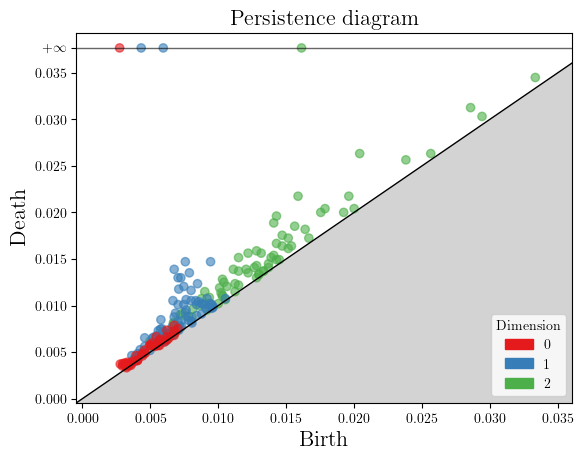

In [15]:
gudhi.plot_persistence_diagram(my_persistence, legend=True)
plt.show()

In [16]:
betti_numbers = {}
for i in range(D + 1):
    betti_numbers[i] = 0
for bar, bd in my_persistence:
    if bd[1] >= 1: 
        betti_numbers[bar] += 1

print("Betti Numbers up to Dimension",D," over the field F_2")
print(betti_numbers)

Betti Numbers up to Dimension 3  over the field F_2
{0: 1, 1: 2, 2: 1, 3: 0}


In [17]:
my_persistence = example2.persistence(homology_coeff_field = 3)

In [18]:
betti_numbers = {}
for i in range(D + 1):
    betti_numbers[i] = 0
for bar, bd in my_persistence:
    if bd[1] >= 1: 
        betti_numbers[bar] += 1

print("Betti Numbers up to Dimension",D," over the field F_3")
print(betti_numbers)

Betti Numbers up to Dimension 3  over the field F_3
{0: 1, 1: 1, 2: 0, 3: 0}


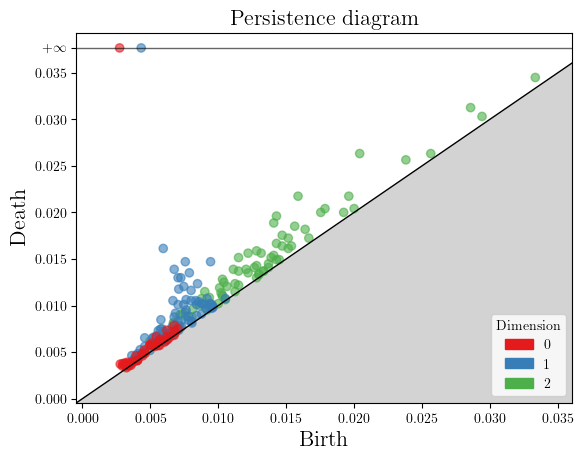

In [19]:
gudhi.plot_persistence_diagram(my_persistence, legend=True)
plt.show()

In [20]:
alphatools.draw_alpha_complex(abstract_cplx, chosen_landmarks, 1, draw_points = True, draw_edges = True, draw_surfaces = True)